<div style="text-align:center">
    <h1 style="text-align:center; font-size:50px; margin-bottom: 5px">Galaxy Creation Station</h1>
    <p style="text-align:center;">This notebook demonstrates the method in Wagg et al. (2021) for sampling positions and metallicities in the Milky Way and how to reproduce Figure 1.</p>
</div>

In [1]:
# general package imports
import h5py as h5
import numpy as np
import astropy.units as u
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import seaborn as sns
from scipy.integrate import quad
from scipy.stats import beta

# custom LISA package
import legwork

# import code from repo
import sys
sys.path.append("../../simulation/src/")
import galaxy

from importlib import reload

In [2]:
# config stuff to make plots look pretty
%config InlineBackend.figure_format = 'retina'
plt.rc('font', family='serif')
fs = 24

params = {'legend.fontsize': fs,
         'axes.labelsize': fs,
         'xtick.labelsize':0.7*fs,
         'ytick.labelsize':0.7*fs}
plt.rcParams.update(params)

# Model Components
For our model of the Milky Way, we assume that the galaxy is composed of three components: a thin disc, a thick disc and a bulge. For each of these we have a distribution for the lookback time, galactocentric radii and heights above the Galactic plane, which we will outline below. First, we can recall that these components have different masses and so will be weighted differently.

We use [Licquia+2015](https://ui.adsabs.harvard.edu/abs/2015ApJ...806...96L/abstract) to get the stellar mass of the disc and bulge. We additionally assume that the thick and thin discs have equal masses.

In [3]:
# masses
stellar_mass = {
    "bulge": 0.91e10 * u.Msun,
    "thin_disc": 5.17e10 * u.Msun / 2,
    "thick_disc": 5.17e10 * u.Msun / 2,
}

total_stellar_mass = 6.08e10 * u.Msun

stellar_mass_fractions = {}
for key in stellar_mass.keys():
    stellar_mass_fractions[key] = stellar_mass[key] / total_stellar_mass

In [4]:
_, _, Z_thick = galaxy.simulate_mw(2000000, components=["thick_disc"], masses=[1]*u.Msun)
_, _, Z_thin = galaxy.simulate_mw(2000000, components=["thin_disc"], masses=[1]*u.Msun)
_, _, Z_bulge = galaxy.simulate_mw(2000000, components=["bulge"], masses=[1]*u.Msun)
_, _, Z = galaxy.simulate_mw(2000000)

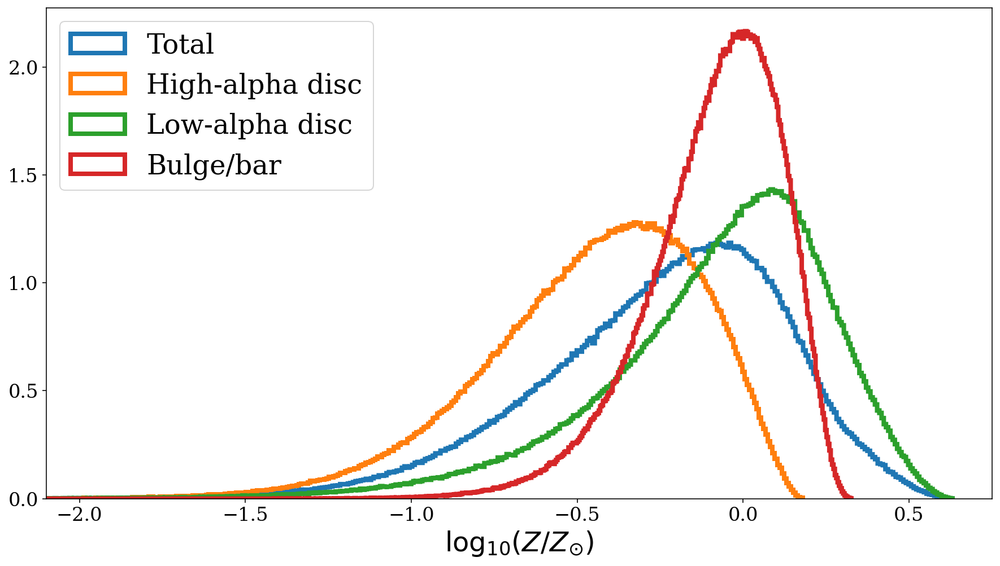

In [5]:
fig, ax = plt.subplots(figsize=(15, 8))

Z_sun = 0.0142

ax.hist(np.log10(Z.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="Total")

ax.hist(np.log10(Z_thick.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="High-alpha disc")
ax.hist(np.log10(Z_thin.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="Low-alpha disc")
ax.hist(np.log10(Z_bulge.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="Bulge/bar")

ax.set_xlim(-2.1, 0.75)

ax.legend(loc="upper left")

ax.set_xlabel(r"$\log_{10} (Z / Z_{\odot})$")

plt.show()

In [6]:
_, _, Z_thick = galaxy.simulate_mw(2000000, components=["thick_disc"], masses=[1]*u.Msun, alt=True)
_, _, Z_thin = galaxy.simulate_mw(2000000, components=["thin_disc"], masses=[1]*u.Msun, alt=True)
_, _, Z_bulge = galaxy.simulate_mw(2000000, components=["bulge"], masses=[1]*u.Msun, alt=True)
_, _, Z = galaxy.simulate_mw(2000000, alt=True)

TypeError: simulate_mw() got an unexpected keyword argument 'alt'

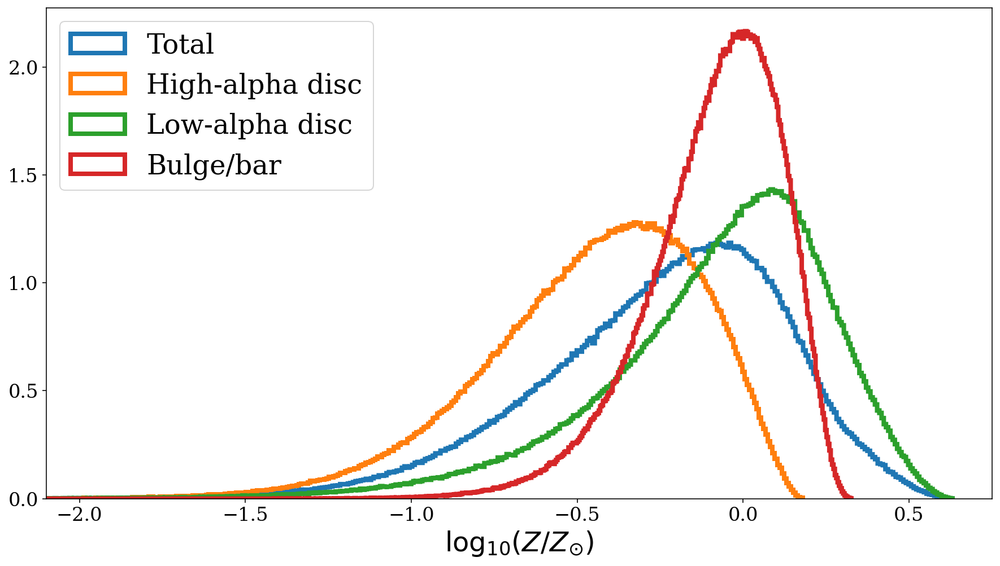

In [7]:
fig, ax = plt.subplots(figsize=(15, 8))

Z_sun = 0.0142

ax.hist(np.log10(Z.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="Total")

ax.hist(np.log10(Z_thick.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="High-alpha disc")
ax.hist(np.log10(Z_thin.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="Low-alpha disc")
ax.hist(np.log10(Z_bulge.value / Z_sun), bins="auto", density=True, histtype="step", lw=4, label="Bulge/bar")

ax.set_xlim(-2.1, 0.75)

ax.legend(loc="upper left")

ax.set_xlabel(r"$\log_{10} (Z / Z_{\odot})$")

plt.show()

# Star formation history
First, we can take a look at the star formation history (SFH). For the thick and thin discs this exponentially declines over the age of the Milky Way at the same rate, using Eq. 4 from [Frankel+18](https://ui.adsabs.harvard.edu/abs/2018ApJ...865...96F/abstract). The thick disc is limited from 8 Gyr to 12 Gyr, then at 8 Gyr the thick disc ends and formation switches to the thin disc. The SFH of the bulge is not well known but we approximate it using a $\beta$ function that peaks around 8 Gyr and drops off at later time. This shape was chosen to fit Fig.7 of [Bovy+19](https://ui.adsabs.harvard.edu/abs/2019MNRAS.490.4740B/abstract).

In [8]:
def disc_SFH(t, tm=12*u.Gyr, tsfr=6.8*u.Gyr, min_time=0*u.Gyr, max_time=8*u.Gyr):
    norm = quad(lambda t: np.exp(-(tm - t * u.Gyr) / tsfr),
                min_time.to(u.Gyr).value, max_time.to(u.Gyr).value)[0]
    SFH = np.exp(-(tm - t) / tsfr) / norm
    SFH[np.logical_or(t < min_time, t > max_time)] = 0.0
    return SFH

def bulge_SFH(t):
    return beta(2, 3, loc=6, scale=6).pdf(t.to(u.Gyr).value)

def total_SFH(t):
    return stellar_mass_fractions["bulge"] * bulge_SFH(t) \
        + stellar_mass_fractions["thin_disc"] * disc_SFH(t, min_time=0*u.Gyr, max_time=7.9999*u.Gyr) \
        + stellar_mass_fractions["thick_disc"] * disc_SFH(t, min_time=8*u.Gyr, max_time=12*u.Gyr)

Let's plot the total SFH of the Milky Way model and also plot the individual SFHs underneath so it is clear where the shape comes from.

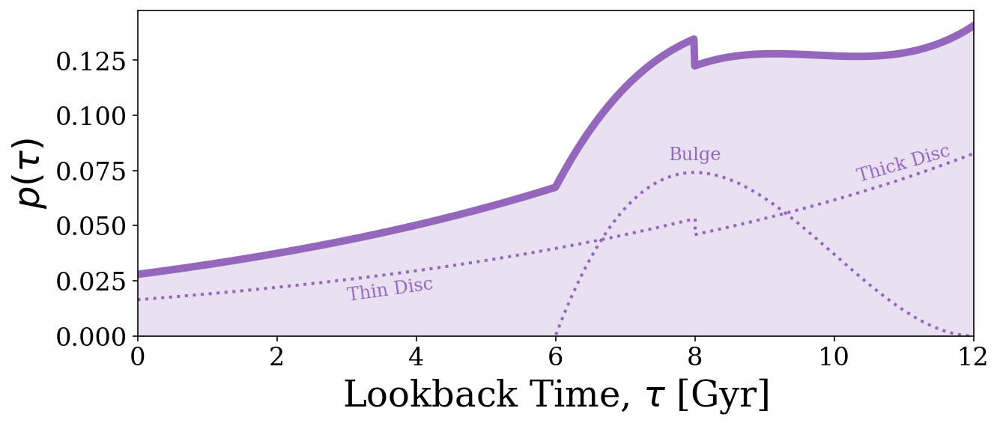

In [9]:
fig, ax = plt.subplots(1, figsize=(10, 4))
colour = "tab:purple"
t_range = np.linspace(0, 12, 1000) * u.Gyr

# calculate each individual SFH and plot them 
SFHs = [disc_SFH(t_range, min_time=0*u.Gyr, max_time=7.9999*u.Gyr),
        disc_SFH(t_range, min_time=8*u.Gyr, max_time=12*u.Gyr),
        bulge_SFH(t_range)]

for SFH in SFHs:
    nonzero = SFH > 0.0
    ax.plot(t_range[nonzero], SFH[nonzero] * 0.25, color=colour, lw=2, linestyle="dotted")

# plot a line between the discontinuous disc models
ax.plot([8, 8] * u.Gyr, np.array([disc_SFH(7.9999*u.Gyr, min_time=0*u.Gyr, max_time=8*u.Gyr),
                                  disc_SFH(8*u.Gyr, min_time=8*u.Gyr, max_time=12*u.Gyr)]) * 0.25,
        lw=2, linestyle="dotted", color=colour)

# plot the full SFH
ax.plot(t_range, total_SFH(t_range), color="tab:purple", lw=5)
ax.fill_between(t_range, 0, total_SFH(t_range), color="tab:purple", alpha=0.2)

ax.set_xlabel(r"Lookback Time, $\tau$ [Gyr]")
ax.set_ylabel(r"$p(\tau)$")

ax.set_xlim(0, 12)
ax.set_ylim(bottom=0)

# label each individual SFH
ax.annotate("Thin Disc", xy=(3, 0.016), rotation=8, fontsize=0.5*fs, color="tab:purple")
ax.annotate("Bulge", xy=(8, 0.08), ha="center", fontsize=0.5*fs, color="tab:purple")
ax.annotate("Thick Disc", xy=(11, 0.07), ha="center", rotation=16, fontsize=0.5*fs, color="tab:purple")

# plt.savefig("../figures/lookback_time_pdf", bbox_inches="tight")

plt.show()

# Radial distribution
For the radial distribution we use the same distribution for each component but with a different scale length. The bulge and thick disc have fixed scale lengths of 1.5 kpc ([Bovy+19](https://ui.adsabs.harvard.edu/abs/2019MNRAS.490.4740B/abstract)) and 2.33 kpc ([Bovy+16](https://ui.adsabs.harvard.edu/abs/2016ApJ...823...30B/abstract)) respectively. The scale length of the thin disc is time dependent and the disc gradually becomes more spread out due to inside-out growth following [Frankel+18](https://ui.adsabs.harvard.edu/abs/2018ApJ...865...96F/abstract).

In [10]:
def R_exp(t, alpha=0.3):
    return 4 * u.kpc * (1 - alpha * (t / (8 * u.Gyr)))

def radial_distribution(r, r0):
    return np.exp(-r / r0) * r / r0**2

def total_radial(r, t):
    return stellar_mass_fractions["bulge"] * radial_distribution(r, r0=1.5 * u.kpc) \
        + stellar_mass_fractions["thin_disc"] * radial_distribution(r, R_exp(t)) \
        + stellar_mass_fractions["thick_disc"] * radial_distribution(r, r0=1/0.43 * u.kpc)

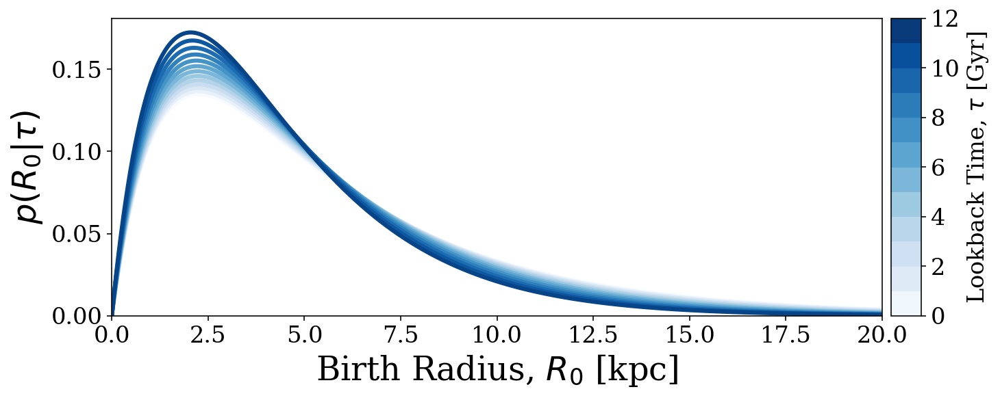

In [11]:
fig, ax = plt.subplots(1, figsize=(12, 4))

cmap = "Blues"

R_range = np.linspace(0, 20, 1000) * u.kpc
t_range = np.linspace(0, 12, 13)

# plot a separate distribution for lots of lookback times
for t in t_range:
    ax.plot(R_range, total_radial(R_range, t * u.Gyr), lw=3, color=plt.get_cmap(cmap)((t / len(t_range))))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=max(t_range)))
cbar = fig.colorbar(sm, boundaries=t_range, aspect=10, pad=0.01)
cbar.set_label(r"Lookback Time, $\tau$ [Gyr]", fontsize=0.7 * fs)
    
ax.set_xlabel(r"Birth Radius, $R_0$ [kpc]")
ax.set_xlim(0, 20)
ax.set_ylabel(r"$p(R_0 | \tau)$")
ax.set_ylim(bottom=0.0)

plt.savefig("../figures/radial_pdf", bbox_inches="tight")

plt.show()

# Metallicity relation
Using [Frankel+18](https://ui.adsabs.harvard.edu/abs/2018ApJ...865...96F/abstract), we assume a tight metallicity-location-time relation and thus, for any given radius and time, we know the metallicity using the function below. We convert this from [Fe/H] to $Z$ using the function from Bertelli 1994.

In [12]:
def FeH(R, t, tm=12*u.Gyr, Fm=-1, grad=-0.075/u.kpc, Rnow=8.7*u.kpc, gamma=0.3):
    return Fm + grad * R - (Fm + grad * Rnow) * (1 - (t / tm))**(gamma)

def metallicity(R, t, zsun=0.0142):
    # See Bertelli 1994 Equation 9
    return np.power(10, 0.977 * FeH(R, t) + np.log10(zsun))

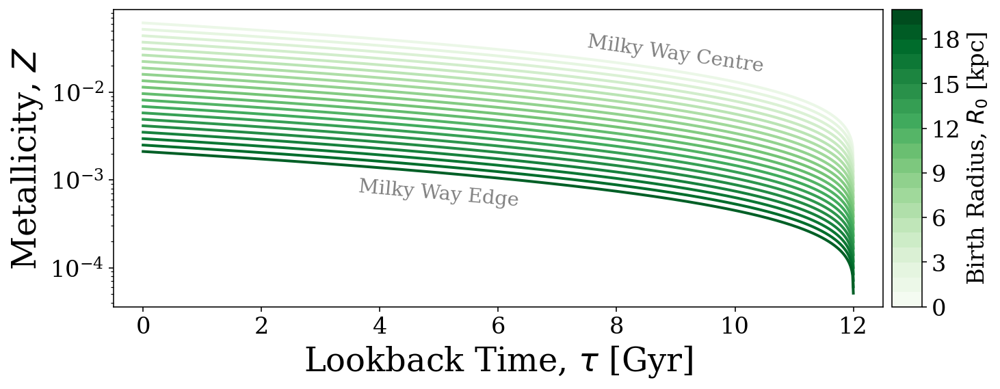

In [13]:
fig, ax = plt.subplots(1, figsize=(12, 4))

cmap = "Greens"

R_range = np.linspace(0, 20, 21)
t_range = np.linspace(0, 12, 1000) * u.Gyr
colors = plt.get_cmap(cmap, len(R_range) + 4)

for i in range(len(R_range)):
    ax.plot(t_range, metallicity(R_range[i] * u.kpc, t_range), lw=2, color=colors(i + 2))

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=max(R_range)))
cbar = fig.colorbar(sm, boundaries=R_range, aspect=10, pad=0.01)
cbar.set_label(r"Birth Radius, $R_0$ [kpc]", fontsize=0.7 * fs)

ax.set_xlabel(r"Lookback Time, $\tau$ [Gyr]")
ax.set_xlim(-0.5, 12.5)
ax.set_ylabel(r"Metallicity, $Z$")
ax.set_yscale("log")

ax.annotate("Milky Way Centre", xy=(9, 2.7e-2), rotation=-8, ha="center", va="center", color="grey", fontsize=0.6*fs)
ax.annotate("Milky Way Edge", xy=(5, 7e-4), rotation=-5, ha="center", va="center", color="grey", fontsize=0.6*fs)

plt.savefig("../figures/metallicity_relation", bbox_inches="tight")

plt.show()

# Vertical spread
As with the radial distribution, we use the same height distribution for each component but with a different scale height. For the bulge we use a scale height of 1.5 kpc, the thick disc we use 0.95 kpc ([Bovy+16](https://ui.adsabs.harvard.edu/abs/2016ApJ...823...30B/abstract)) and the thin disc we use 0.3 kpc ([McMillan11](https://ui.adsabs.harvard.edu/abs/2011MNRAS.414.2446M/abstract))

In [14]:
def P_z(z, zd=0.3 * u.kpc):
    return 1 / zd * np.exp(-z/zd)

def total_vertical(z):
    return stellar_mass_fractions["bulge"] * P_z(z, zd=1.5 * u.kpc) \
        + stellar_mass_fractions["thin_disc"] * P_z(z, zd=0.3 * u.kpc) \
        + stellar_mass_fractions["thick_disc"] * P_z(z, zd=0.95 * u.kpc)

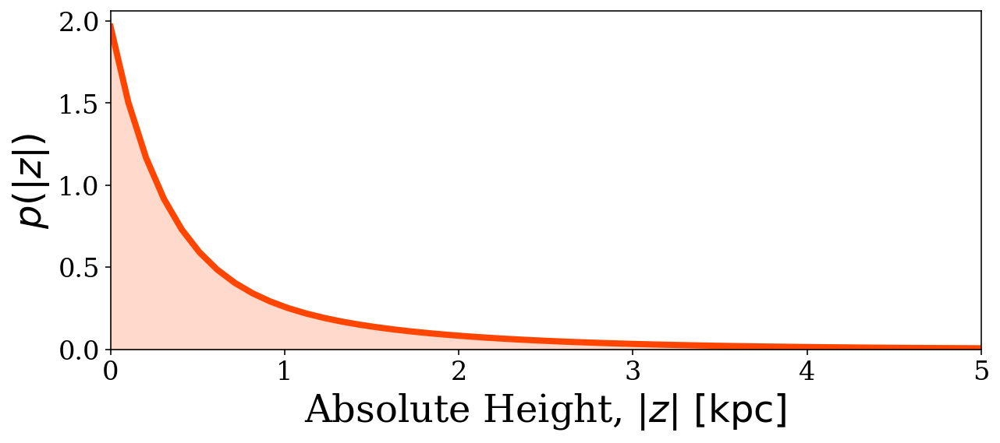

In [15]:
z_range = np.linspace(0, 5) * u.kpc

fig, ax = plt.subplots(1, figsize=(10, 4))

color = "orangered"

ax.plot(z_range, total_vertical(z_range), lw=4, color=color)
ax.fill_between(z_range, 0, total_vertical(z_range), color=color, alpha=0.2)

ax.set_xlabel(r"Absolute Height, $|z|\ [\rm kpc]$")
ax.set_ylabel(r"$p(|z|)$")

# ax.set_yscale("log")

ax.set_xlim(0, max(z_range.value))
ax.set_ylim(bottom=0)

plt.savefig("../figures/height_pdf", bbox_inches="tight")

plt.show()

# Put it all together
One function to rule them all

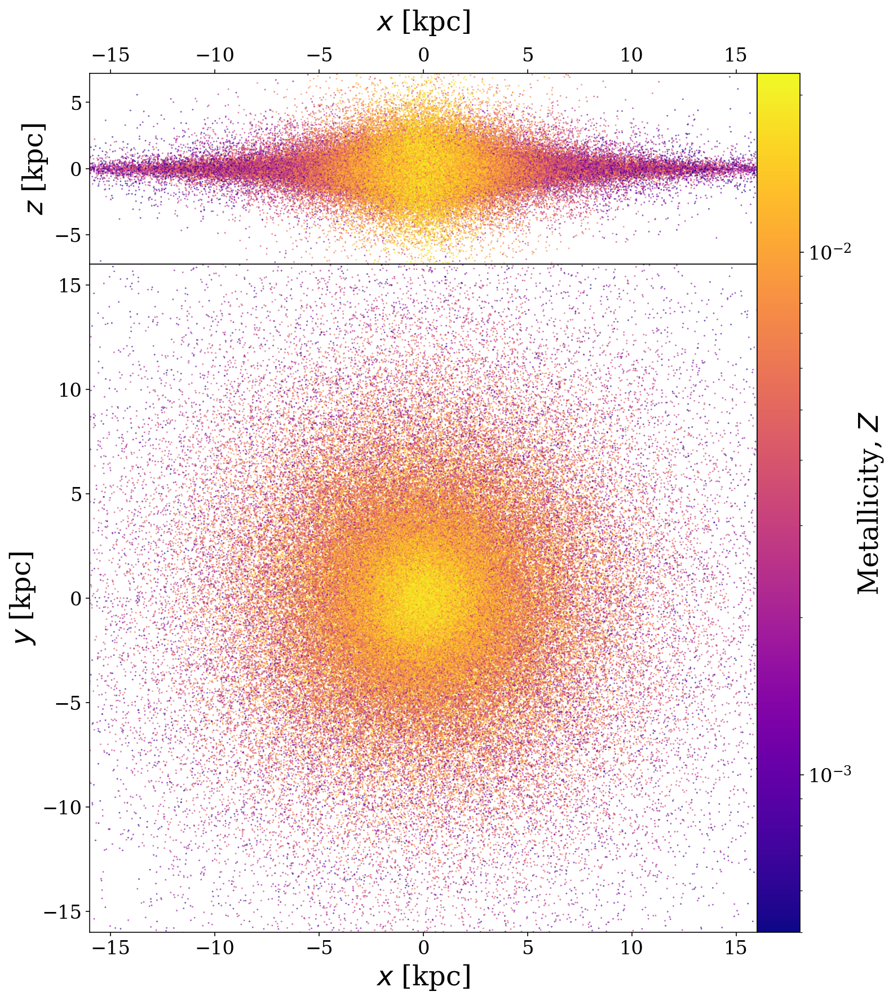

In [17]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, ret_pos=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-7.2, 7.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

# plt.savefig("../figures/random_galaxy.png", bbox_inches="tight")

plt.show()

0.009009662375201311
0.009869172477330294


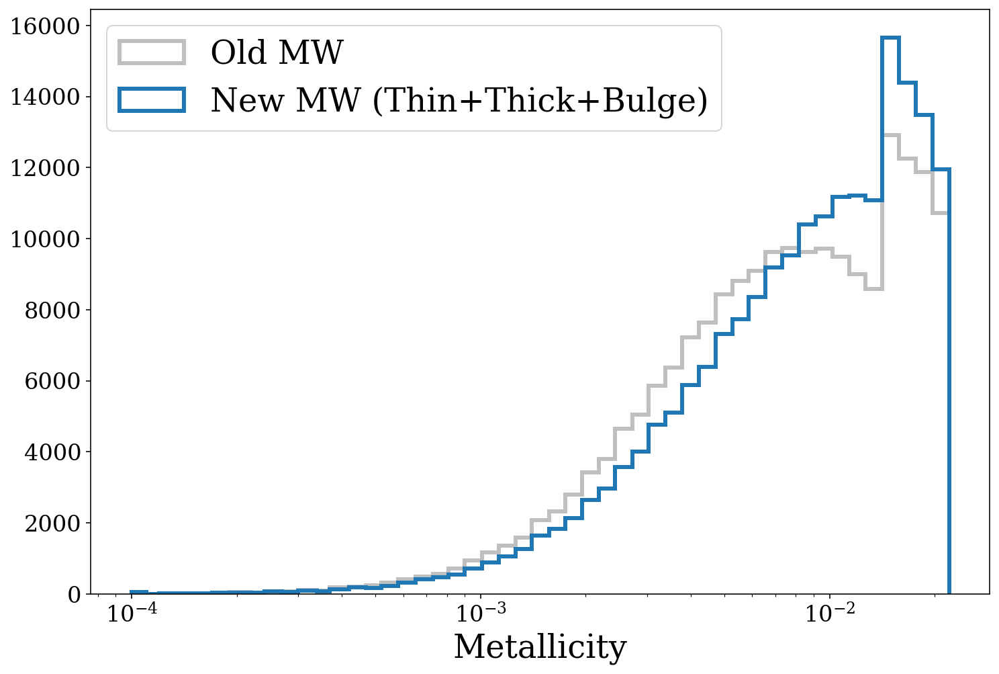

In [472]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, components=["thin_disc"], masses=[1]*u.Msun, ret_pos=True, old=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

print(np.mean(Z))

plt.hist(Z.value, bins=np.logspace(-4, np.log10(0.022), 50).round(5), histtype="step", lw=3, label="Old MW", color="grey", alpha=0.5)

tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, ret_pos=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

print(np.mean(Z))

plt.hist(Z.value, bins=np.logspace(-4, np.log10(0.022), 50).round(5), histtype="step", lw=3, label="New MW (Thin+Thick+Bulge)")

plt.legend(loc="upper left")

plt.xlabel("Metallicity")

plt.xscale("log")
plt.show()

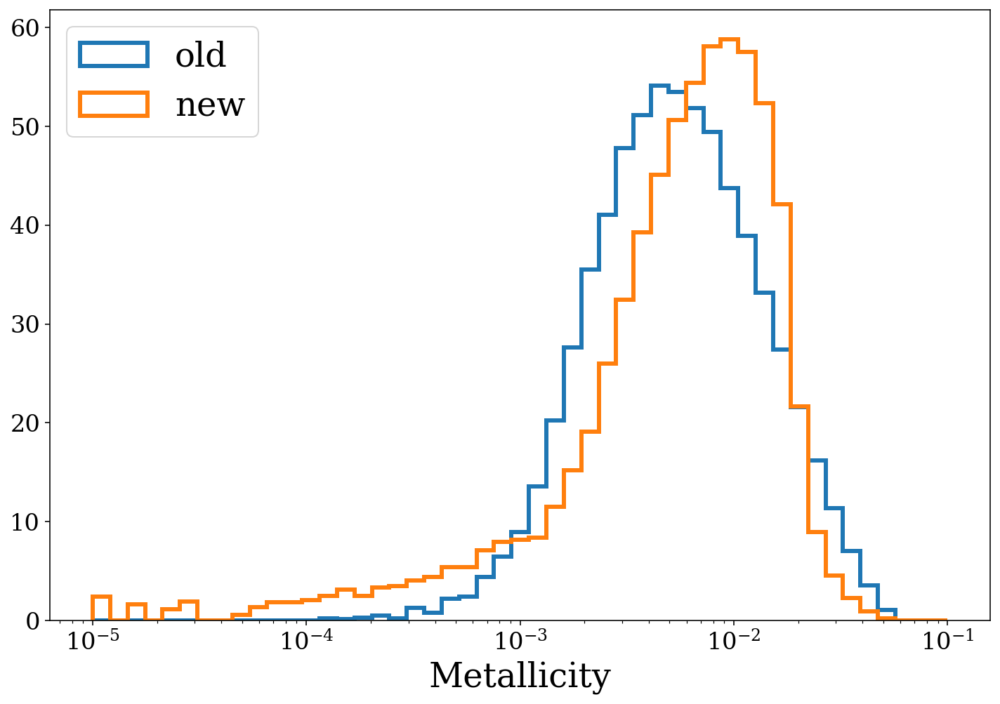

In [435]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, components=["old"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

plt.hist(Z.value, bins=np.logspace(-5, -1, 50), histtype="step", lw=3, label="old", density=True)

tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, ret_pos=True)
R, z, theta = pos

plt.hist(Z.value, bins=np.logspace(-5, -1, 50), histtype="step", lw=3, label="new", density=True)

plt.legend(loc="upper left")

plt.xlabel("Metallicity")

plt.xscale("log")
plt.show()

<hr>

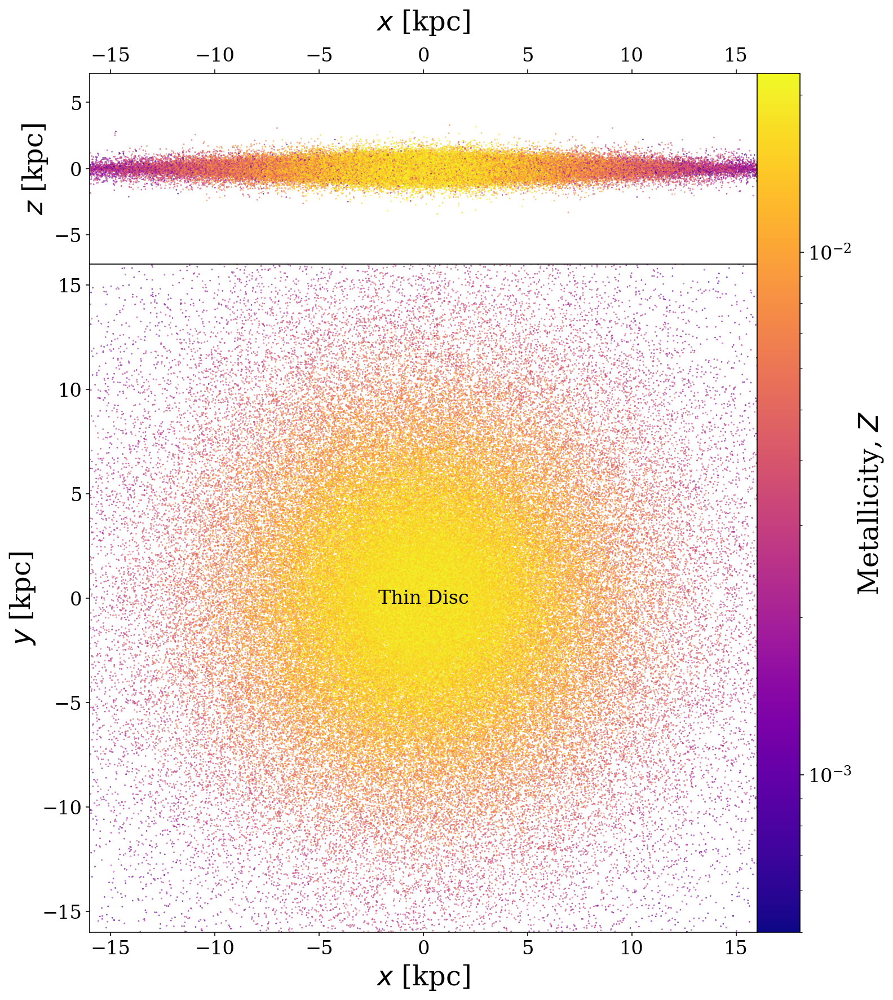

In [404]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, components=["thin_disc"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-7.2, 7.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

axes[1].annotate("Thin Disc", xy=(0, 0), ha="center", va="center", fontsize=0.7*fs)

plt.savefig("../figures/random_thin_disc.png", bbox_inches="tight")

plt.show()

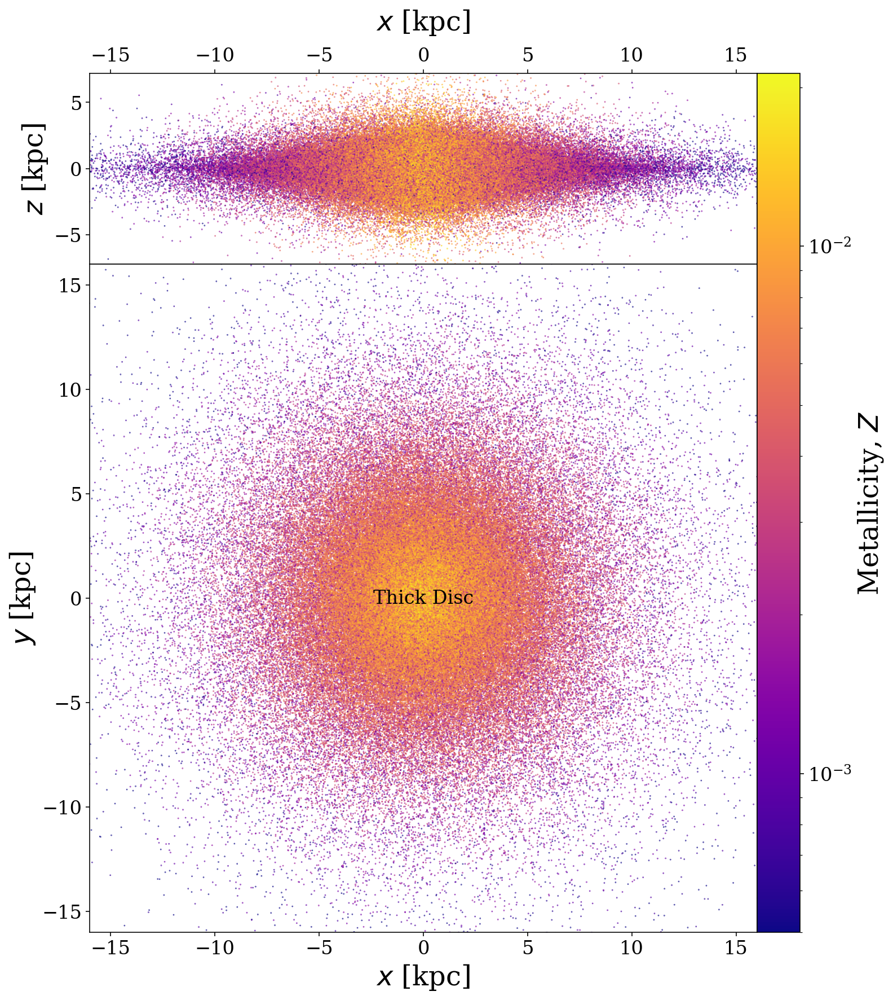

In [453]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, components=["thick_disc"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-7.2, 7.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

axes[1].annotate("Thick Disc", xy=(0, 0), ha="center", va="center", fontsize=0.7*fs)

plt.savefig("../figures/random_thick_disc.png", bbox_inches="tight")

plt.show()

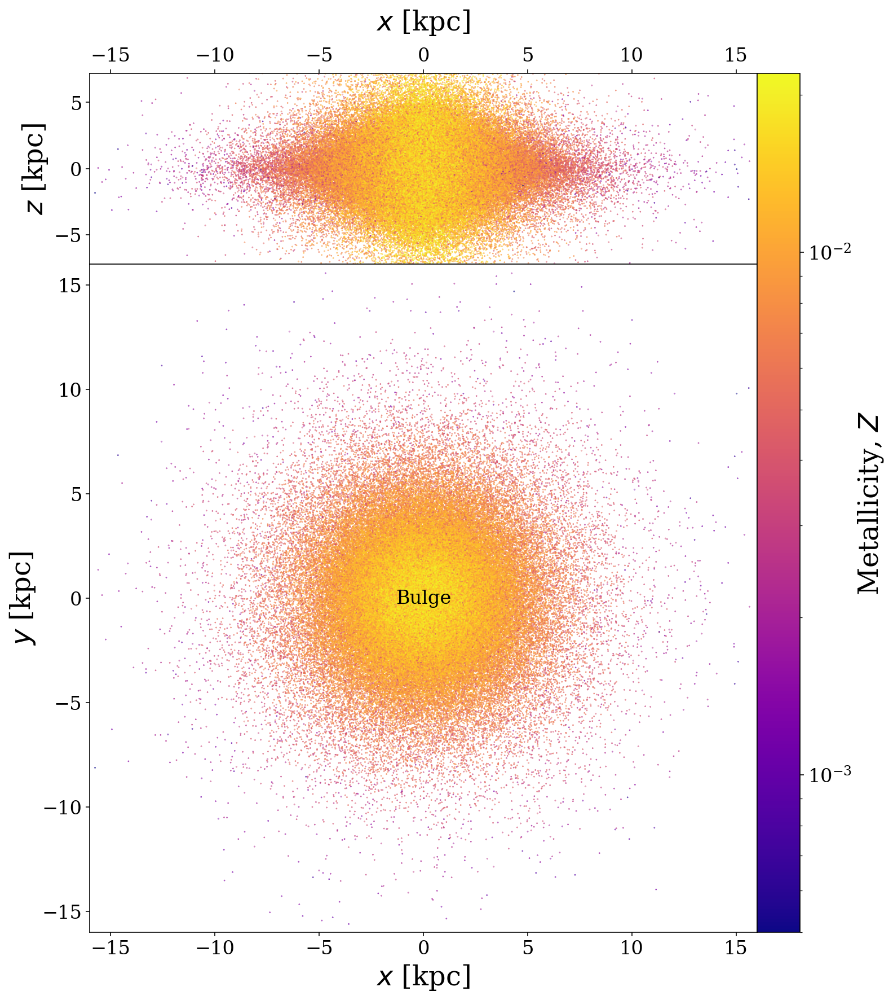

In [401]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(200000, components=["bulge"], masses=[1]*u.Msun, ret_pos=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, axes = plt.subplots(2, 1, figsize=(10 * 1.2475, 14), gridspec_kw={'height_ratios': [4, 14]})
axes[1].set_aspect("equal")
plt.subplots_adjust(hspace=0)

lim = 16

axes[0].scatter(x, z, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))

axes[0].set_xlabel(r"$x$ [kpc]", labelpad=15)
axes[0].xaxis.tick_top()
axes[0].xaxis.set_label_position("top")
axes[0].set_xlim(-lim, lim)

axes[0].set_ylabel(r"$z$ [kpc]")
axes[0].set_ylim(-7.2, 7.2)

scatt = axes[1].scatter(x.value, y.value, c=Z.value, s=0.1, cmap="plasma", norm=LogNorm(vmin=5e-4))
cbar = fig.colorbar(scatt, ax=axes, pad=0.0)
cbar.set_label(r"Metallicity, $Z$")

axes[1].set_xlabel(r"$x$ [kpc]")
axes[1].set_ylabel(r"$y$ [kpc]")

axes[1].set_xlim(-lim, lim)
axes[1].set_ylim(-lim, lim)

axes[1].annotate("Bulge", xy=(0, 0), ha="center", va="center", fontsize=0.7*fs)

plt.savefig("../figures/random_bulge.png", bbox_inches="tight")

plt.show()

Text(0, 0.5, 'Metallicity')

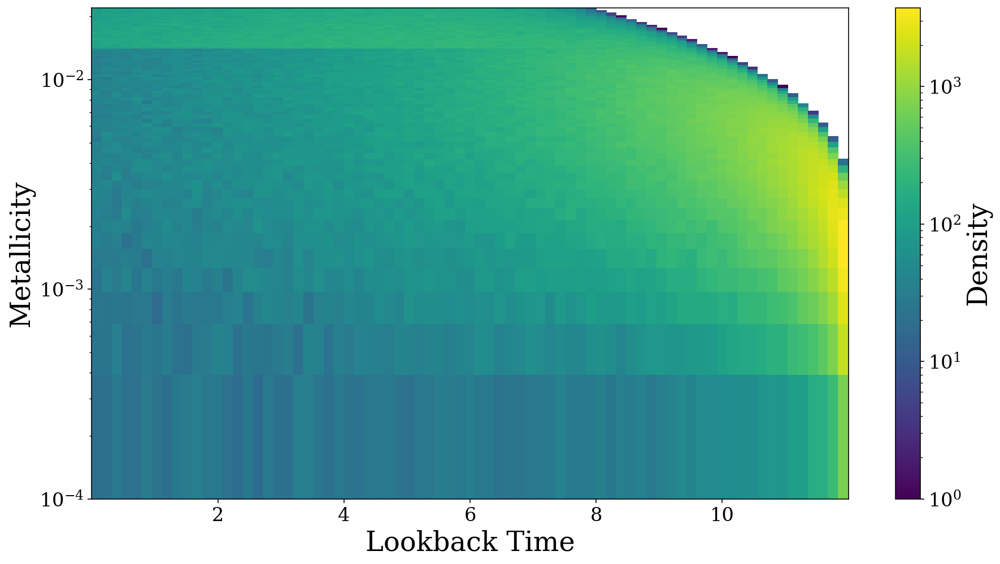

In [496]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(1000000, components=["thin_disc"], masses=[1]*u.Msun, ret_pos=True, old=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, ax = plt.subplots(figsize=(15, 8))

hist = ax.hist2d(tau.value, Z, bins=75, norm=LogNorm())
cbar = fig.colorbar(hist[3], label="Density")
ax.set_yscale("log")

ax.set_xlabel("Lookback Time")
ax.set_ylabel("Metallicity")

Text(0, 0.5, 'Metallicity')

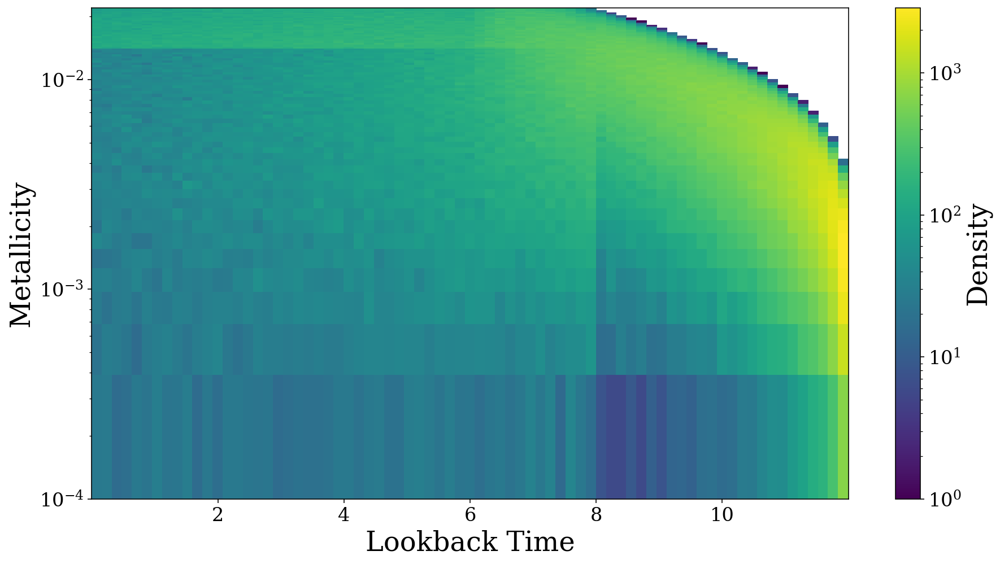

In [497]:
tm = 12 * u.Gyr
tau, D, Z, pos = galaxy.simulate_mw(1000000, ret_pos=True)
R, z, theta = pos

min_Z_compas = 1e-4
max_Z_compas = 0.022

Z[Z < min_Z_compas] = 1e-4
Z[Z > max_Z_compas] = 10**(np.random.uniform(np.log10(0.01416), np.log10(max_Z_compas), len(Z[Z > max_Z_compas])))

x = R * np.cos(theta)
y = R * np.sin(theta)

fig, ax = plt.subplots(figsize=(15, 8))

hist = ax.hist2d(tau.value, Z, bins=75, norm=LogNorm())
cbar = fig.colorbar(hist[3], label="Density")
ax.set_yscale("log")

ax.set_xlabel("Lookback Time")
ax.set_ylabel("Metallicity")

In [134]:
def test(x, a, b, loc=0 * u.Gyr, scale=1):
    y = (x - loc) / scale
    return y**(a - 1) * (1 - y)**(b - 1) / scale

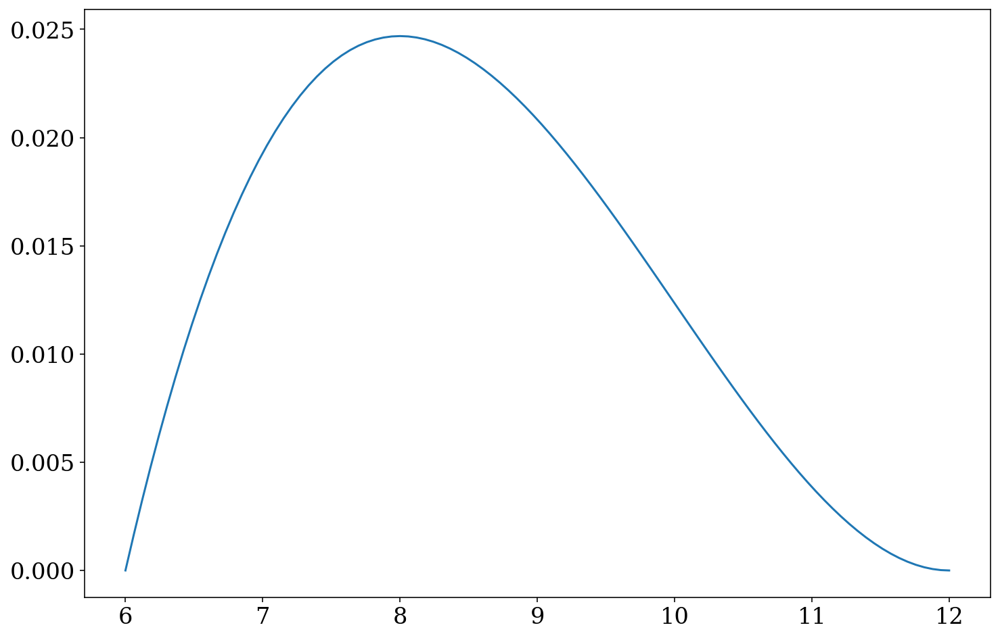

In [136]:
x_range = np.linspace(6, 12, 100) * u.Gyr

plt.plot(x_range, test(x_range, 2, 3, loc=6 * u.Gyr, scale=6*u.Gyr))

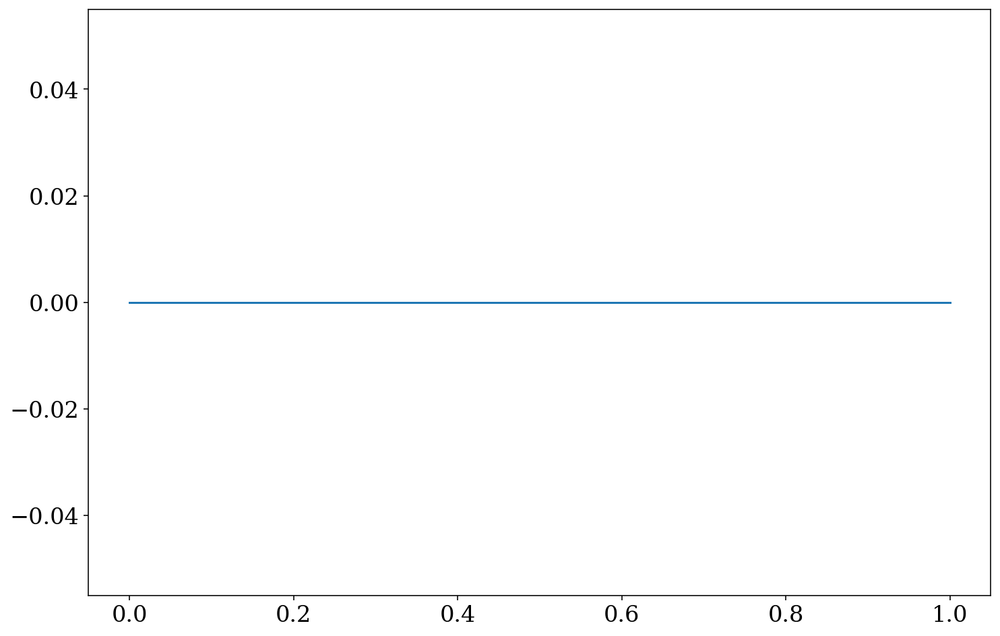

In [108]:
plt.plot(x_range, beta.pdf(x_range, 2, 3, loc=6, scale=6))